<a href="https://colab.research.google.com/github/cyborgrob/dog_vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Unzip the downloaded data into Google Drive (only need to run once after uploaded it to Drive)
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

# 🐶 End-to-end Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog, given the image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition:

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed for each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning
* There are 120 different breeds (this means there are 120 different classes)
* There are 10,000+ images in the training set (these images have labels)
* There are 10,000+ images in the test set (these images have no labels, because we'll want to predict them)


### Getting our workspace ready
* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:" + tf.__version__)
print("TF Hub version:" + hub.__version__)

# Check for GPU availability
print("GPU", "available :)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version:2.15.0
TF Hub version:0.15.0
GPU not available :(


### Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first - turning our data into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

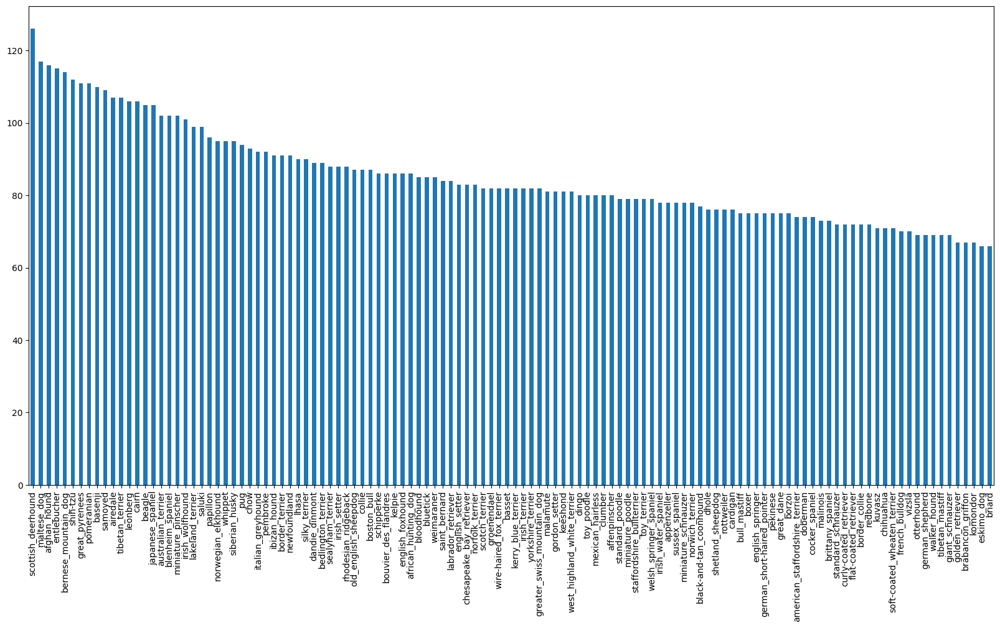

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
import numpy as np
np.median(labels_csv.breed.value_counts())

82.0

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

KeyboardInterrupt: ignored

### Getting images and their labels
Let's get a list of all our image file path names.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create path names from image ids
file_names = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
file_names[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of file names matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(file_names):
  print("File names match actual amount of files. Proceed.")
else:
  print("File names do not match actual amount of files. Check the target directory.")

NameError: ignored

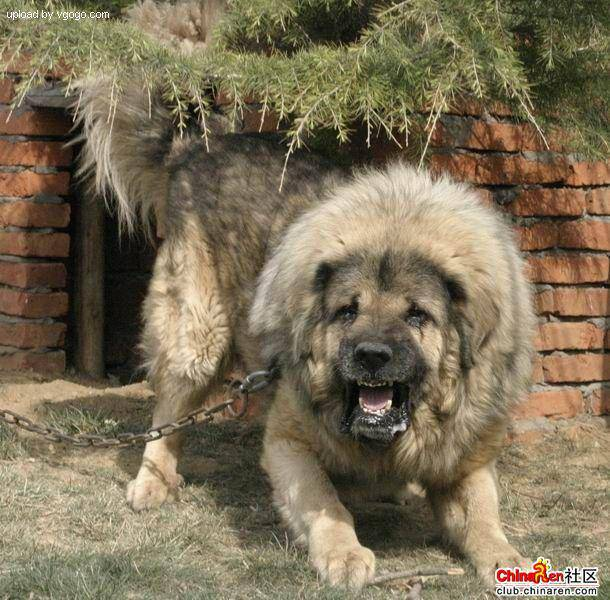

In [ ]:
# One more check
Image(filename=file_names[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our training image file paths in a list, let's prepare our labels.

In [ ]:
labels = labels_csv.breed
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
# labels = np.array(labels) # does same thing as below
labels = labels_csv.breed.to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of file names
if len(labels) == len(file_names):
  print("Number of labels matches number of file names.")
else:
  print("Number of labels does not match number of file names. Check data directories.")

NameError: ignored

In [ ]:
# Find unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into an array of booleans
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into Integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there should be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
file_names[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y labels
X = file_names
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting. By convention, parameters you can set as a user are named in all caps
NUM_IMAGES = 1000 #@param {type:"slider", min: 1000, max: 10000, step: 100}


In [ ]:
# Let's split our data into train & validation sets. You can use `train_test_split` for this; you could also do manual indexing
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size of NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a look at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### Preprocessing Images (Turning Images into Tensors)
To preprocess our images into tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the filepath and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1 scale)
5. Resize the `image` to be a size of (224, 224) (it's standard practice to resize all images into a standardized size)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread # stands for 'image read'
image = imread(file_names[42])
image.shape

(257, 350, 3)

In [ ]:
image # a bunch of RGB values between 0 and 255

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Turn image into a constant Tensor
tf.constant(image)

# A Tensor will be able to run on the much faster GPU, whereas an numpy array can only run on the slower CPU

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now that we've seen what an image looks like as a tensor, let's make a function to preprocess them.
1. Take an image filepath as input
2. Use TensorFlow to read the filepath and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1 scale)
5. Resize the `image` to be a size of (224, 224) (it's standard practice to resize all images into a standardized size)
6. Return the modified `image`

In [ ]:
# Define image size (a lot of machine learning is lining up the shape of your inputs with the model that you're using)
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values (called "normalization")
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

### Turning our Data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000 images in one go - they might not all fit into memory!

So that's why we do about 32 images at a time (you can manually adjust the batch size if needed).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function that returns a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image path name and its associated label, processes the image, and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return (image, label)


In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now that we've got a way to turn our data into tuples of Tensors in the form `(image, label)`, let's make a function to turn all of our data (X & y) into batches.

In [ ]:
# Define the batch size - 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs. Shuffles the data if it's training data, but doesn't shuffle if it's validation data. Also accepts test data as input.
  """
  # If the data is a test data set, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    # Turn filepaths into Tensors
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths, no labels
    data_batch = data.map(process_image).batch(batch_size=batch_size)
    return data_batch

  # If the data is a validation data set, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    # Create (image, label) tuples. This also turns the image path into a preprocessed image (because `get_image_label` calls `process_image`). Then batch the data.
    data_batch = data.map(get_image_label).batch(batch_size=batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels before calling/mapping the process_image function is faster than shuffling the images
    data = data.shuffle(buffer_size=len(X)) # `buffer_size=len(X)` means to shuffle the whole list
    # Create (image, label) tuples. This also turns the image path into a preprocessed image (because `get_image_label` calls `process_image`). Then batch the data.
    data_batch = data.map(get_image_label).batch(batch_size=batch_size)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X=X_train, y=y_train)
val_data = create_data_batches(X=X_val, y=y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches
Our data is now in batches. However, these can be a little hard to understand/comprehend. Let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
# Convert dataset into iterators
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

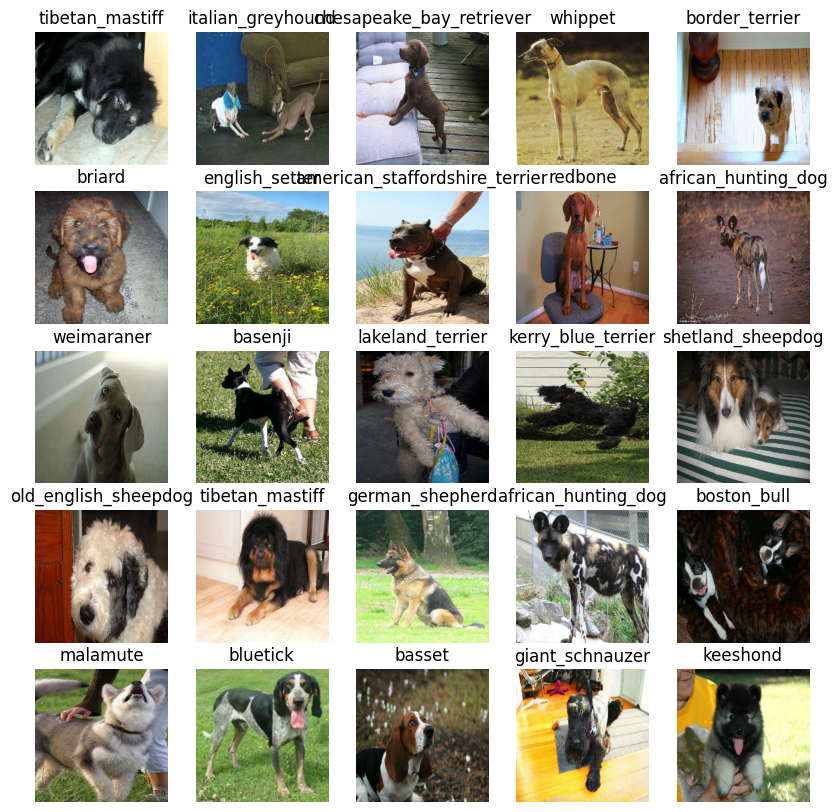

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(images=train_images, labels=train_labels)

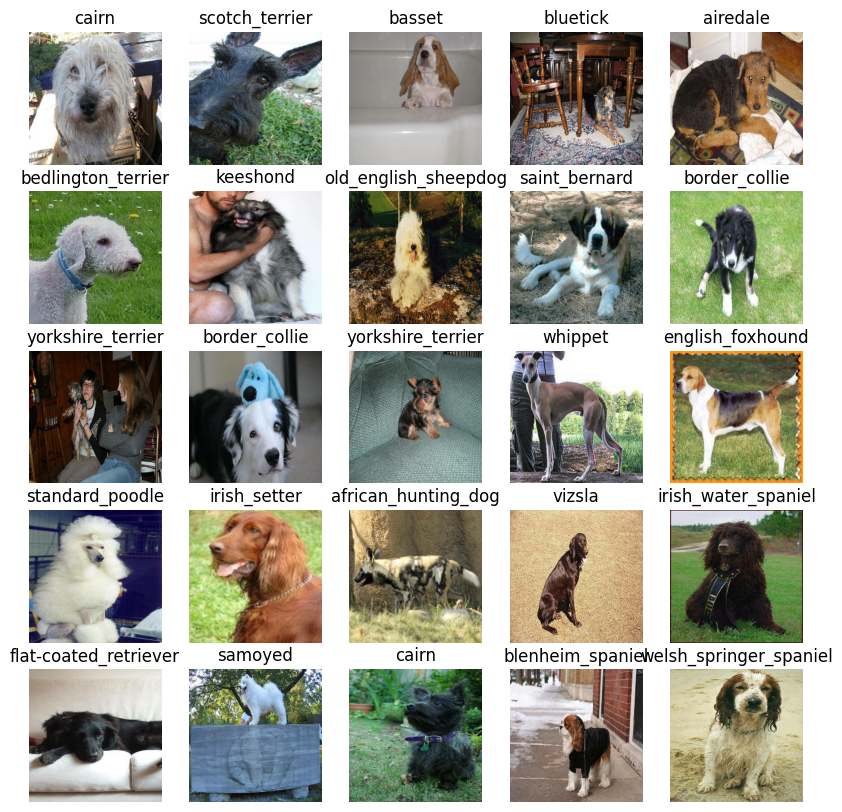

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(images=val_images, labels=val_labels)

## 5. Modelling

### Building a Model
Before we build a model, there are a few things we need to define:
1. The input shape (our images shape, in the form of Tensors) to our model.
2. The output shape (image labels, in the form of Tensors) of our model.
3. The URL of the model we want to use from TensorFlow Hub/Kaggle: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Should match the shape of our data batch which we saw above. Batch, height, width, color channels

# Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"


Now that we've got our inputs, outputs, and model ready to go, let's put them together into a Keras Deep Learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape, and the model we've chosen as parameters
* Defines the layers in a Keras model in a sequential fashion (eg, do this first, then this, then that)
* Compiles the model (says how it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras


In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: " + model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape, activation="softmax") # Layer 2 (output layer)
      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(input_shape)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating Callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress, or stop training early if a model stops improving.

We'll create two callbacks - one for TensorBoard which helps track our model's proress, and another for early stopping, which prevents our model from training too long/overfitting.

### TensorBoard Callback
To set up a TensorBoard callback, we'll need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                         # Make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir=logdir)


### Early stopping callback
Early stopping helps prevent our model from overfitting by stopping training if a certain metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

### Training a model (on a subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min: 10, max: 100, step: 10}


In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available :)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available :)


Let's create a function that trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model, passing it the training data, validation data, number of epochs (`NUM_EPOCHS`), and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and a return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create model
  model = create_model()

  # Create new TensorBoard session every time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit model to the data, passing it the callbacks we've created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping]
            )
  # Return the fitted model
  return model


In [ ]:
# Fit our model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 153s 6s/step - loss: 4.6642 - accuracy: 0.1050 - val_loss: 3.4887 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 3s 98ms/step - loss: 1.6768 - accuracy: 0.6625 - val_loss: 2.1881 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 4s 175ms/step - loss: 0.5895 - accuracy: 0.9250 - val_loss: 1.6959 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 3s 136ms/step - loss: 0.2596 - accuracy: 0.9825 - val_loss: 1.5038 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 3s 102ms/step - loss: 0.1502 - accuracy: 0.9975 - val_loss: 1.4057 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 3s 110ms/step - loss: 0.1014 - accuracy: 0.9987 - val_loss: 1.3779 - val_accuracy: 0.6400
Epoch

**Question:** it looks like our model is overfitting because it's performing far better on the training set than the validation set. What are some ways to prevent overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a **good thing**. It means our model is learning!

### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the log directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and Evaluating Predictions using a Trained Model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 113ms/step


array([[1.0081111e-03, 2.8858030e-05, 5.3585815e-04, ..., 6.7285704e-04,
        1.1403894e-05, 9.7892655e-04],
       [1.2444874e-03, 7.2882866e-04, 1.1448056e-01, ..., 1.7510339e-04,
        4.9236021e-03, 1.5302244e-04],
       [4.3899359e-05, 2.7484685e-04, 5.0089719e-05, ..., 7.1522911e-05,
        9.4178430e-04, 2.7927321e-03],
       ...,
       [5.1738316e-06, 1.1517608e-05, 2.1290820e-05, ..., 8.2722357e-07,
        4.3631403e-06, 2.2888336e-05],
       [2.2487876e-03, 1.5814489e-04, 1.0239797e-04, ..., 1.9728711e-04,
        9.2611073e-05, 3.3202581e-03],
       [8.6097547e-04, 7.5808988e-05, 1.9424692e-03, ..., 2.0145120e-03,
        3.8686596e-04, 2.7268523e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
predictions[0]

array([1.00811105e-03, 2.88580304e-05, 5.35858155e-04, 9.63107523e-05,
       4.59571253e-04, 1.30866974e-04, 5.93555951e-03, 1.23396720e-04,
       9.23843691e-05, 3.69556859e-04, 9.52273724e-04, 4.77640206e-05,
       2.54820887e-04, 9.68674867e-05, 7.71029561e-04, 9.47570225e-05,
       2.86022605e-05, 9.58047211e-02, 2.82266865e-05, 2.72475008e-05,
       1.08299241e-03, 7.00358214e-05, 1.34888005e-05, 3.77601536e-04,
       5.68775031e-05, 2.52917293e-04, 4.91815269e-01, 4.30951404e-05,
       1.36465591e-03, 1.55940623e-04, 1.12469985e-04, 4.09494620e-04,
       1.48587875e-04, 9.55267569e-06, 1.56404640e-05, 1.29683092e-02,
       6.97621144e-05, 9.94247617e-04, 3.41831153e-04, 1.67110666e-05,
       4.31841286e-03, 2.68263502e-05, 1.58950163e-04, 3.10984760e-04,
       5.24129609e-05, 6.84944025e-05, 6.88026194e-05, 2.39580535e-04,
       8.47561241e-05, 1.34548191e-05, 5.26012409e-05, 3.67622997e-05,
       2.75673869e-04, 3.52269766e-04, 8.44823080e-05, 1.33055059e-04,
      

These are all probabilities the model has estimated for each unique dog breed. The highest probability is the one the model would guess. They all add up to 1 (This is softmax activation).

In [ ]:
np.sum(predictions[0])

0.9999999

In [ ]:
max(predictions[0])

0.49181527

In [ ]:
# First prediction
index = 42
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}") # Find the actual breed name using the numerical probability

Max value (probability of prediction): 0.7671595215797424
Sum: 1.0
Max index: 113
Predicted label: walker_hound


Having the above functionality is great, but we want to be able to do it at scale. And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to 'unbatchify' it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
# Here is the code not function-ized

images_ = []
labels_ = [] # the '_' is so we don't overwrite the variable 'labels' we've used before

# Loop through unbatched data
for image, label, in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]



(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
# Create a function to do this
def unbatchify(dataset):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels
  """
  image_list = []
  label_list = []

  # Loop through unbatched data
  for image, label in dataset.unbatch().as_numpy_iterator():
    image_list.append(image)
    label_list.append(unique_breeds[np.argmax(label)])

  return image_list, label_list

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make them all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, and an array of images and an integer
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, it's predicted probability, the truth label, and the target image on a single plot


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # Change plot title to be Predicted, Probability of Predicted, and Truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label,),
                                    color=color)


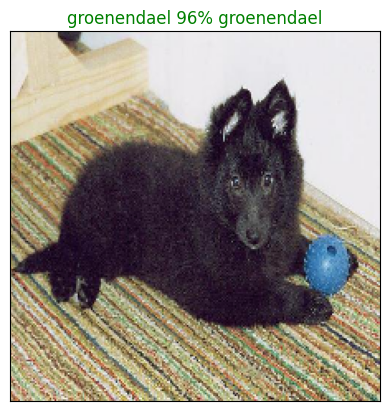

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

Now we've got one function to visualize our model's top prediction. Let's make another to view our model's top 10 predictions.

This function will:
* Take an input of a prediction probabilities array, a ground truth array, and an integer
* Find the predictions using `get_pred_label()`
* Find the top 10:
 * Prediction probabilities indexes
 * Prediction probabilities values
 * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample `n`.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes (demonstrated below with predictions[0].argsort())
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                               top_10_pred_values,
                               color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    # Where the label in the top 10 is equal to the true label, set the color to be green
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


In [ ]:
predictions[0].argsort() # Gives the order of indexes which will sort this array in ascending order (highest probabilities at the end)

array([ 92,  33, 118,  49,  22,  34,  39, 115, 112, 108,  41,  19,  18,
        16,   1,  61,  51,  84,  60,  27,  11,  44,  50,  75,  24,  86,
        45,  46,  36,  21,  63,  56,  99, 101,  54,  48,  87,   8,  72,
        15,   3,  13,  98,  30, 114,  66,   7, 107,   5,  55,  32,  29,
        91,  42,  64, 113,  69,  67,  78,  94,  47,  25, 110,  12,  88,
        52,  80,  43,  38,  53,   9,  82,  71,  23,  31,  58, 104,   4,
         2, 117,  62,  14,  74,  10, 119,  95,  37,   0,  93,  76, 116,
        20,  96,  28,  85,  90, 111,  89, 105,  81,  83,  40, 106,   6,
        57,  97,  68,  77, 100,  65, 102,  35, 109, 103,  79,  59,  73,
        17,  70,  26])

In [ ]:
predictions[0]

array([1.00811105e-03, 2.88580304e-05, 5.35858155e-04, 9.63107523e-05,
       4.59571253e-04, 1.30866974e-04, 5.93555951e-03, 1.23396720e-04,
       9.23843691e-05, 3.69556859e-04, 9.52273724e-04, 4.77640206e-05,
       2.54820887e-04, 9.68674867e-05, 7.71029561e-04, 9.47570225e-05,
       2.86022605e-05, 9.58047211e-02, 2.82266865e-05, 2.72475008e-05,
       1.08299241e-03, 7.00358214e-05, 1.34888005e-05, 3.77601536e-04,
       5.68775031e-05, 2.52917293e-04, 4.91815269e-01, 4.30951404e-05,
       1.36465591e-03, 1.55940623e-04, 1.12469985e-04, 4.09494620e-04,
       1.48587875e-04, 9.55267569e-06, 1.56404640e-05, 1.29683092e-02,
       6.97621144e-05, 9.94247617e-04, 3.41831153e-04, 1.67110666e-05,
       4.31841286e-03, 2.68263502e-05, 1.58950163e-04, 3.10984760e-04,
       5.24129609e-05, 6.84944025e-05, 6.88026194e-05, 2.39580535e-04,
       8.47561241e-05, 1.34548191e-05, 5.26012409e-05, 3.67622997e-05,
       2.75673869e-04, 3.52269766e-04, 8.44823080e-05, 1.33055059e-04,
      

In [ ]:
predictions[0].argsort()[-10:] # List the last 10 items of predictions[0]

array([102,  35, 109, 103,  79,  59,  73,  17,  70,  26])

In [ ]:
predictions[0].argsort()[-10:][::-1] # Reverse the order so the highest probability comes first

array([ 26,  70,  17,  73,  59,  79, 103, 109,  35, 102])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]] # Get the actual percentages by indexing predictions[0] with the order

array([0.49181527, 0.11864714, 0.09580472, 0.05201773, 0.04477981,
       0.02503852, 0.02292679, 0.0191642 , 0.01296831, 0.01228363],
      dtype=float32)

In [ ]:
predictions[0].max()

0.49181527

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['cairn', 'lhasa', 'border_terrier', 'maltese_dog',
       'irish_wolfhound', 'norfolk_terrier',
       'soft-coated_wheaten_terrier', 'tibetan_terrier', 'dandie_dinmont',
       'silky_terrier'], dtype=object)

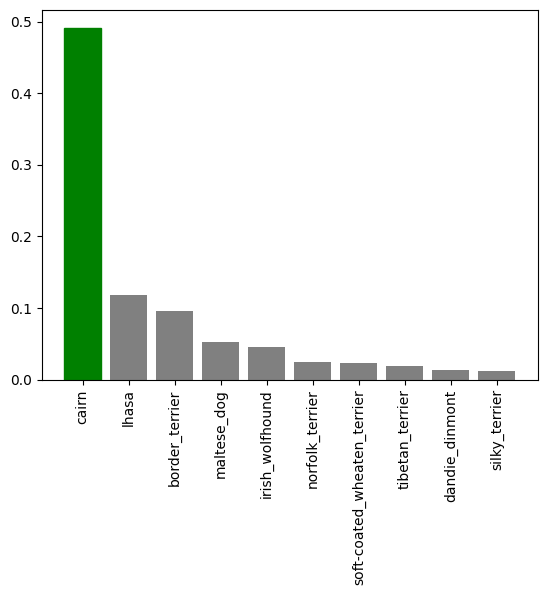

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=0)



Now that we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

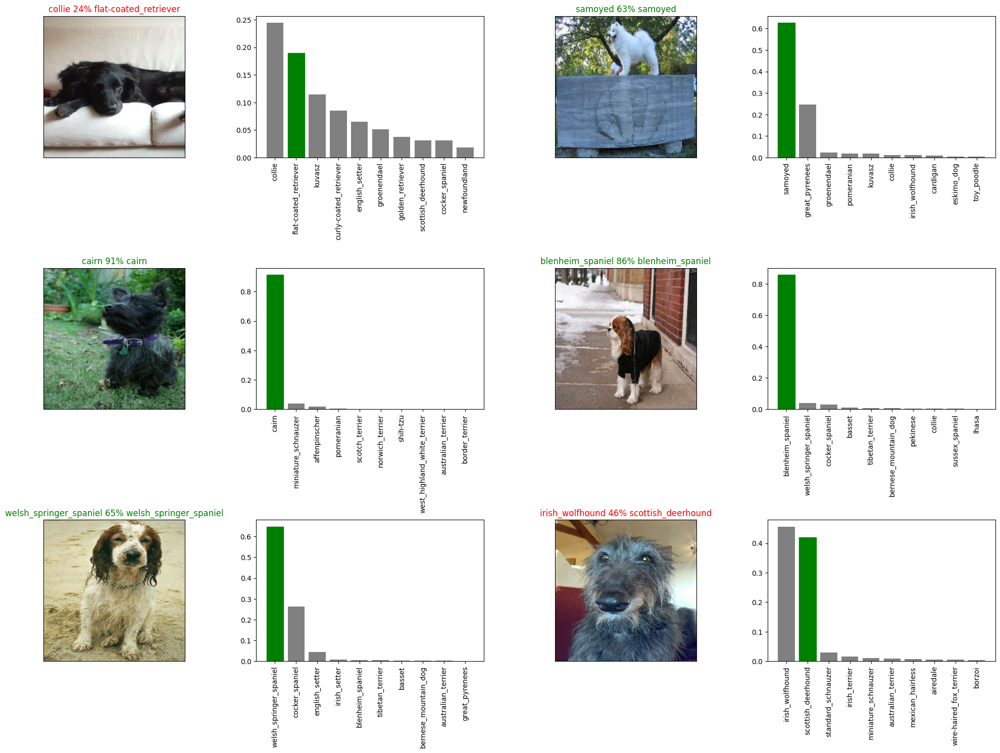

In [ ]:
# Let's check out a few predictions and their values
n_multiplier = 20 # Which index of images to test
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10 * num_cols, 5 * num_rows))

for n in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*n+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=n+n_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*n+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=n+n_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our model's predictions and true labels?

## Saving and Reloading a trained model



In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a 'models' directory and appends a suffix (string).
  """
  # Create a model directory pathname with the current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model. Let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20231225-00421703464930-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20231225-00421703464930-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20231225-00421703464930-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20231225-00421703464930-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 119ms/step - loss: 1.2362 - accuracy: 0.6850


[1.2362030744552612, 0.6850000023841858]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 3s 180ms/step - loss: 1.2362 - accuracy: 0.6850


[1.2362030744552612, 0.6850000023841858]

## Training a Big Dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X=X, y=y, batch_size=32)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 mins for the first epoch) because the GPU we're using in the runtime has to load all the images into memory.

This is why we tested out the model on a fraction of the total data above - we wouldn't want to spend a lot of time (in the case of real-life business cases, it could be days/a week) training the model only to find out something was broken and it didn't work.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 97ms/step - loss: 1.3373 - accuracy: 0.6719
Epoch 2/100
320/320 [==============================] - 29s 91ms/step - loss: 0.3943 - accuracy: 0.8819
Epoch 3/100
320/320 [==============================] - 35s 109ms/step - loss: 0.2321 - accuracy: 0.9372
Epoch 4/100
320/320 [==============================] - 37s 117ms/step - loss: 0.1526 - accuracy: 0.9659
Epoch 5/100
320/320 [==============================] - 30s 94ms/step - loss: 0.1059 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 31s 95ms/step - loss: 0.0768 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 28s 88ms/step - loss: 0.0568 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0467 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 30s 95ms/step - loss: 0.0366 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 29s 92ms/step 

In [ ]:
# Save the full model
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20231225-01551703469322-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20231225-01551703469322-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load the saved full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20231225-01551703469322-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20231225-01551703469322-full-image-set-mobilenetv2-Adam.h5


## Making Predictions on the Test data set
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it the same format.

Luckily, we created `create_data_batches()` earlier, which can take a list of file names as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model


In [ ]:
# Load the test image file names
test_path = "drive/MyDrive/Dog Vision/test/"
test_file_names = [test_path + fname for fname in os.listdir(test_path)]
test_file_names[:10]

['drive/MyDrive/Dog Vision/test/e5657f523cf994628f63b673c88e9112.jpg',
 'drive/MyDrive/Dog Vision/test/dd98d4023806fdee7721b42db812f131.jpg',
 'drive/MyDrive/Dog Vision/test/e7ed96b272013c6de9505a753816ce75.jpg',
 'drive/MyDrive/Dog Vision/test/e1b0cbcf3235fe9a7b35c1652081ff8d.jpg',
 'drive/MyDrive/Dog Vision/test/e0165801e47527205e45295aba441972.jpg',
 'drive/MyDrive/Dog Vision/test/dd539ec1933bc47bc80b1447a26aef45.jpg',
 'drive/MyDrive/Dog Vision/test/e78d3997b4e7f4abc1299f81b8e3b2d9.jpg',
 'drive/MyDrive/Dog Vision/test/dcb6ce994241db517c1ebe42897db826.jpg',
 'drive/MyDrive/Dog Vision/test/e2a9a7580a1424bc6531b2b7375338db.jpg',
 'drive/MyDrive/Dog Vision/test/e806a67a05289ac6de6831001664b81b.jpg']

In [ ]:
len(test_file_names)

10357

In [ ]:
# Create data batches
test_data = create_data_batches(X=test_file_names, test_data=True)
test_data # No labels/booleans this time, just images

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

# Make predictions on test data batch using the full loaded model
**Note:**: calling `predict()` on our full model and passing it the test data batch will take a long time to run (~1 hour)

In [ ]:
# Make predictions on test data with model tested on full training data set
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 185s 545ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our model's prediction probability outputs in a DataFrame with an ID column and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image IDs from their filepath
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a csv to submit it to Kaggle

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_file_names[:10]

['drive/MyDrive/Dog Vision/test/e5657f523cf994628f63b673c88e9112.jpg',
 'drive/MyDrive/Dog Vision/test/dd98d4023806fdee7721b42db812f131.jpg',
 'drive/MyDrive/Dog Vision/test/e7ed96b272013c6de9505a753816ce75.jpg',
 'drive/MyDrive/Dog Vision/test/e1b0cbcf3235fe9a7b35c1652081ff8d.jpg',
 'drive/MyDrive/Dog Vision/test/e0165801e47527205e45295aba441972.jpg',
 'drive/MyDrive/Dog Vision/test/dd539ec1933bc47bc80b1447a26aef45.jpg',
 'drive/MyDrive/Dog Vision/test/e78d3997b4e7f4abc1299f81b8e3b2d9.jpg',
 'drive/MyDrive/Dog Vision/test/dcb6ce994241db517c1ebe42897db826.jpg',
 'drive/MyDrive/Dog Vision/test/e2a9a7580a1424bc6531b2b7375338db.jpg',
 'drive/MyDrive/Dog Vision/test/e806a67a05289ac6de6831001664b81b.jpg']

In [ ]:
# Append test image IDs to predictions DataFrame
import os
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)] # [0] indexing because we only want the file name, not the ".jpg"
test_ids[:10]

NameError: ignored

In [ ]:
preds_df["id"] = test_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5657f523cf994628f63b673c88e9112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd98d4023806fdee7721b42db812f131,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7ed96b272013c6de9505a753816ce75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1b0cbcf3235fe9a7b35c1652081ff8d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0165801e47527205e45295aba441972,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0868fa59f5b4e8c92e3ea230cf912328,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,07ec68dd37d6b9f89e551820f5ca946f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,092376c380c9d09c4af6e98ef2278925,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,07217f9dab968cf02c4cb37acf2acc28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5657f523cf994628f63b673c88e9112,4.283489e-08,3.505505e-07,1.550531e-08,1.772035e-08,3.525295e-09,4.631935e-08,3.319149e-10,5.467751e-10,1.461133e-08,...,1.965441e-09,4.947333e-12,3.797390e-10,8.849916e-10,1.143213e-09,5.499344e-11,8.157463e-11,5.026653e-08,2.079033e-09,3.328143e-11
1,dd98d4023806fdee7721b42db812f131,1.035060e-12,1.061992e-13,9.433446e-16,1.485263e-13,1.380449e-09,6.558850e-10,3.830592e-10,9.999992e-01,1.606797e-10,...,4.703916e-09,4.633989e-11,3.159268e-11,2.379078e-13,9.815492e-14,7.989141e-13,1.633991e-14,8.945852e-11,5.843492e-11,2.060257e-15
2,e7ed96b272013c6de9505a753816ce75,9.083341e-08,3.004583e-10,5.877918e-11,1.749933e-07,8.561327e-08,1.665477e-11,9.970940e-01,7.711093e-08,7.193666e-10,...,1.160587e-07,8.155283e-07,2.650021e-08,3.501224e-09,1.929119e-10,4.374155e-09,3.763761e-08,2.011710e-10,8.459002e-08,4.619533e-04
3,e1b0cbcf3235fe9a7b35c1652081ff8d,1.997427e-10,6.403456e-10,8.444379e-09,3.189128e-10,4.999954e-12,1.315984e-07,8.803681e-11,3.479606e-10,2.119940e-11,...,5.949603e-07,3.437042e-06,5.151311e-10,4.118905e-11,6.761372e-10,1.486948e-14,9.012051e-09,2.370690e-11,1.656491e-10,8.577890e-11
4,e0165801e47527205e45295aba441972,2.350735e-08,2.356628e-09,6.595928e-09,3.504052e-06,5.892130e-05,8.727536e-10,6.363943e-08,2.643885e-06,3.168949e-07,...,3.251415e-11,4.206883e-08,2.210406e-06,3.149549e-09,1.550481e-09,3.216878e-10,7.811000e-13,1.147333e-04,3.434396e-10,5.056171e-10


In [ ]:
# Export to csv
preds_df.to_csv("drive/MyDrive/Dog Vision/full-model-predictions-submission-1-mobilenetV2.csv", index=False)

## Making predictions on Custom Images
To make predictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilities to prediction labels
* Compare the predicted labels to the custom images


In [ ]:
# Get custom image file paths
import os
custom_path = "drive/MyDrive/Dog Vision/custom-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/custom-photos/husker.jpg',
 'drive/MyDrive/Dog Vision/custom-photos/collie.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(X=custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 165ms/step


In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['siberian_husky', 'collie']

In [ ]:
# Get custom images (unbatchify() function won't work since there aren't labels...maybe this is something we can fix later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

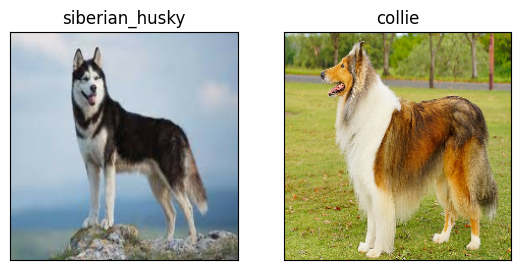

In [ ]:
# Check custom image predictions
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)